# CyberBullying Detection using NLP & Machine Learning (Dataset creation)

### 1. Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns 
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import re
import string
import matplotlib.pyplot as plt
from wordcloud import WordCloud

### 2. Import Datasets

In [2]:
df_cyber = pd.read_csv("Datasets/cyberbullying_tweets.csv")
df_twitter = pd.read_csv("Datasets/twitter_parsed_dataset.csv")
df_twitter_racism = pd.read_csv("Datasets/twitter_racism_parsed_dataset.csv")
df_twitter_sexism = pd.read_csv("Datasets/twitter_sexism_parsed_dataset.csv")

### 3.  Check first 10 lines of any dataset

#### 3.1  cyberbullying_tweets.csv

In [3]:
df_cyber.head(10)

,tweet_text,cyberbullying_type
0,"In other words #katandandre, your food was cra...",not_cyberbullying
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying
5,"@Raja5aab @Quickieleaks Yes, the test of god i...",not_cyberbullying
6,Itu sekolah ya bukan tempat bully! Ga jauh kay...,not_cyberbullying
7,Karma. I hope it bites Kat on the butt. She is...,not_cyberbullying
8,@stockputout everything but mostly my priest,not_cyberbullying
9,Rebecca Black Drops Out of School Due to Bully...,not_cyberbullying


#### 3.2  twitter_parsed_dataset.csv

In [4]:
df_twitter.head(10)

,index,id,Text,Annotation,oh_label
0,5.75E+17,5.75E+17,@halalflaws @biebervalue @greenlinerzjm I read...,none,0.0
1,5.72E+17,5.72E+17,@ShreyaBafna3 Now you idiots claim that people...,none,0.0
2,3.90E+17,3.90E+17,"RT @Mooseoftorment Call me sexist, but when I ...",sexism,1.0
3,5.68E+17,5.68E+17,"@g0ssipsquirrelx Wrong, ISIS follows the examp...",racism,1.0
4,5.76E+17,5.76E+17,#mkr No No No No No No,none,0.0
5,5.61E+17,5.61E+17,RT @TRobinsonNewEra: http://t.co/nkkCbpcHEo Sa...,none,0.0
6,4.37E+17,4.37E+17,RT @Millhouse66 @Maureen_JS nooo not sexist bu...,sexism,1.0
7,5.76E+17,5.76E+17,Going to make some pancakes.....Don't hve any ...,none,0.0
8,5.73E+17,5.73E+17,RT @ahtweet: @freebsdgirl How dare you have fe...,none,0.0
9,5.00E+17,5.00E+17,RT @Newmanzaa: There's something wrong when a ...,sexism,1.0


#### 3.3  twitter_racism_parsed_dataset.csv

In [5]:
df_twitter_racism.head(10)

,index,id,Text,Annotation,oh_label
0,5.767493e+17,5.767493e+17,@AAlwuhaib1977 Muslim mob violence against Hin...,racism,1
1,5.408905e+17,5.408905e+17,@Te4m_NiGhtM4Re http://t.co/5Ih7MkDbQG,none,0
2,5.678433e+17,5.678433e+17,@jncatron @isra_jourisra @AMPalestine Islamoph...,racism,1
3,5.766462e+17,5.766462e+17,"Finally I'm all caught up, and that sudden dea...",none,0
4,5.713492e+17,5.713492e+17,@carolinesinders @herecomesfran *hugs*,none,0
5,5.102409e+17,5.102409e+17,"Please, PLEASE start using ""is your discernmen...",none,0
6,5.588514e+17,5.588514e+17,@aymannathem As soon as ISIS chased all the mi...,none,0
7,5.754918e+17,5.754918e+17,@Ali_Gharib @MaxBlumenthal Glad you like it. h...,none,0
8,5.646041e+17,5.646041e+17,@HuffPostRelig Islam invaded and conquered 2/3...,racism,1
9,5.633700e+17,5.633700e+17,@semzyxx Do you approve of your pedophile prop...,racism,1


#### 3.4  twitter_sexism_parsed_dataset.csv

In [6]:
df_twitter_sexism.head(10)

,index,id,Text,Annotation,oh_label
0,5.35198627292254E+017,5.35198627292254E+017,RT @BeepsS: @senna1 @BeepsS: I'm not sexist bu...,sexism,1.0
1,5.75984924030714E+017,5.75984924030714E+017,There's some very hate able teams this year #MKR,none,0.0
2,5.7233536016588E+017,5.7233536016588E+017,"RT @The_Eccles: ""Everyone underestimated us"" \...",none,0.0
3,5.72337925708374E+017,5.72337925708374E+017,RT @NOTLukeDarcy: did @Channel7 or #MKR actual...,none,0.0
4,4.43033024528011E+017,4.43033024528011E+017,"No, you don't. @Shut_Up_Jeff: I thought of a r...",sexism,1.0
5,5.69577286308987E+017,5.69577286308987E+017,RT @Wateronatrain: @MT8_9 You might like this ...,sexism,1.0
6,5.75951008863429E+017,5.75951008863429E+017,RT @kholly265: I bet the campers vote strategi...,none,0.0
7,5.73948678966108E+017,5.73948678966108E+017,@EvvyKube it is absurd how much of my amazon w...,none,0.0
8,5.7233188575119E+017,5.7233188575119E+017,RT @DanielleVLee: Colin is obviously malnouris...,none,0.0
9,5.69655750961668E+017,5.69655750961668E+017,@NewsCoverUp @RJennromao @GBabeuf @DavidJo5295...,none,0.0


#### 3.5  youtube_parsed_dataset.csv

### 4. Check Datasets type values and sum

#### 4.1  cyberbullying_tweets.csv

In [7]:
df_cyber.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47692 entries, 0 to 47691
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_text          47692 non-null  object
 1   cyberbullying_type  47692 non-null  object
dtypes: object(2)
memory usage: 745.3+ KB


In [8]:
df_cyber['cyberbullying_type'].value_counts()

religion               7998
age                    7992
gender                 7973
ethnicity              7961
not_cyberbullying      7945
other_cyberbullying    7823
Name: cyberbullying_type, dtype: int64

#### 4.2  twitter_parsed_dataset.csv

In [9]:
df_twitter.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16851 entries, 0 to 16850
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   index       16851 non-null  object 
 1   id          16850 non-null  object 
 2   Text        16850 non-null  object 
 3   Annotation  16848 non-null  object 
 4   oh_label    16848 non-null  float64
dtypes: float64(1), object(4)
memory usage: 658.4+ KB


In [10]:
df_twitter['Annotation'].value_counts()

none      11501
sexism     3377
racism     1970
Name: Annotation, dtype: int64

#### 4.3  twitter_racism_parsed_dataset.csv

In [11]:
df_twitter_racism.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13471 entries, 0 to 13470
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   index       13471 non-null  float64
 1   id          13471 non-null  float64
 2   Text        13471 non-null  object 
 3   Annotation  13471 non-null  object 
 4   oh_label    13471 non-null  int64  
dtypes: float64(2), int64(1), object(2)
memory usage: 526.3+ KB


In [12]:
df_twitter_racism['Annotation'].value_counts()

none      11501
racism     1970
Name: Annotation, dtype: int64

#### 4.4  twitter_sexism_parsed_dataset.csv

In [13]:
df_twitter_sexism.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14881 entries, 0 to 14880
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   index       14881 non-null  object 
 1   id          14880 non-null  object 
 2   Text        14880 non-null  object 
 3   Annotation  14878 non-null  object 
 4   oh_label    14878 non-null  float64
dtypes: float64(1), object(4)
memory usage: 581.4+ KB


In [14]:
df_twitter_sexism['Annotation'].value_counts()

none      11501
sexism     3377
Name: Annotation, dtype: int64

#### 4.5 youtube_parsed_dataset.csv

### 5. Graph of any Dataset

#### 5.1 cyberbullying_tweets.csv

[Text(0.5, 1.0, 'Graph of cyberbullying_tweets.csv')]

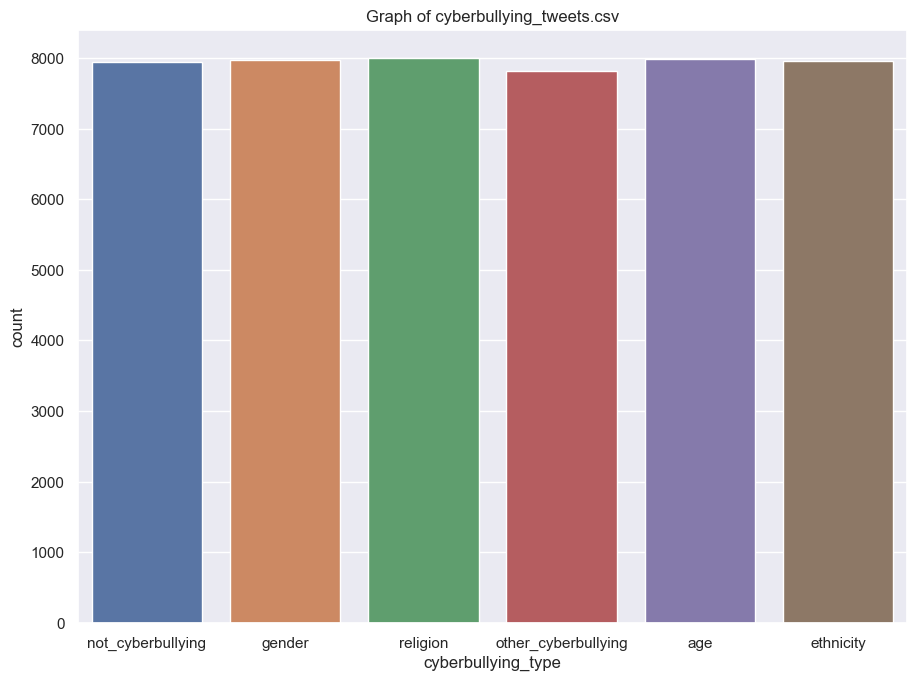

In [15]:
sns.set(rc={'figure.figsize':(10.7,7.7)})
sns.countplot(x='cyberbullying_type', data=df_cyber).set(title="Graph of cyberbullying_tweets.csv")

#### 5.2 twitter_parsed_dataset.csv

[Text(0.5, 1.0, 'Graph of twitter_parsed_dataset.csv')]

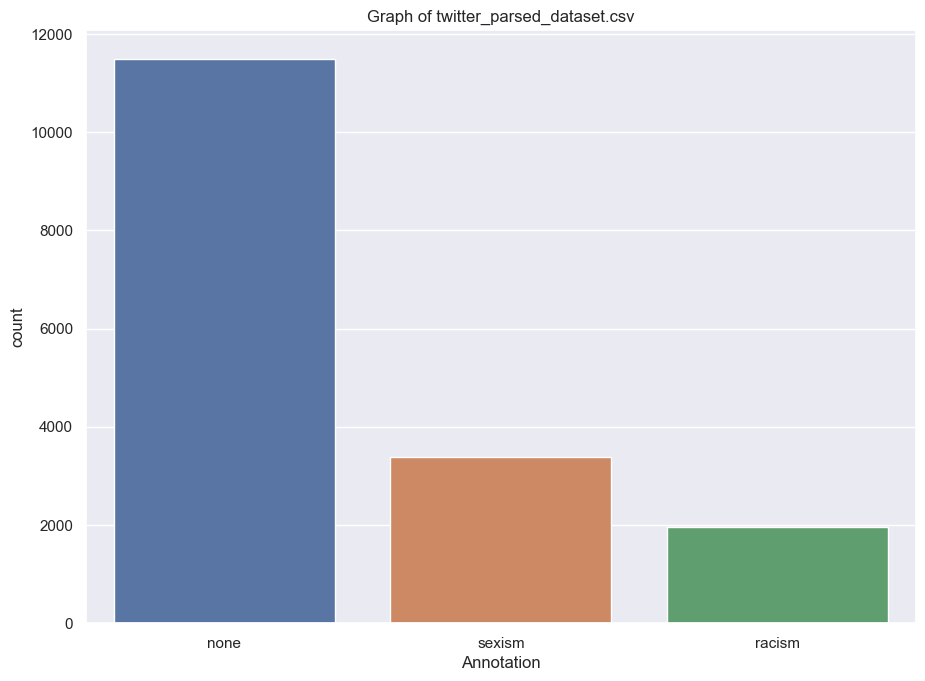

In [16]:
sns.set(rc={'figure.figsize':(10.7,7.7)})
sns.countplot(x='Annotation', data=df_twitter).set(title="Graph of twitter_parsed_dataset.csv")

#### 5.3 twitter_racism_parsed_dataset.csv

[Text(0.5, 1.0, 'Graph of twitter_racism_parsed_dataset.csv')]

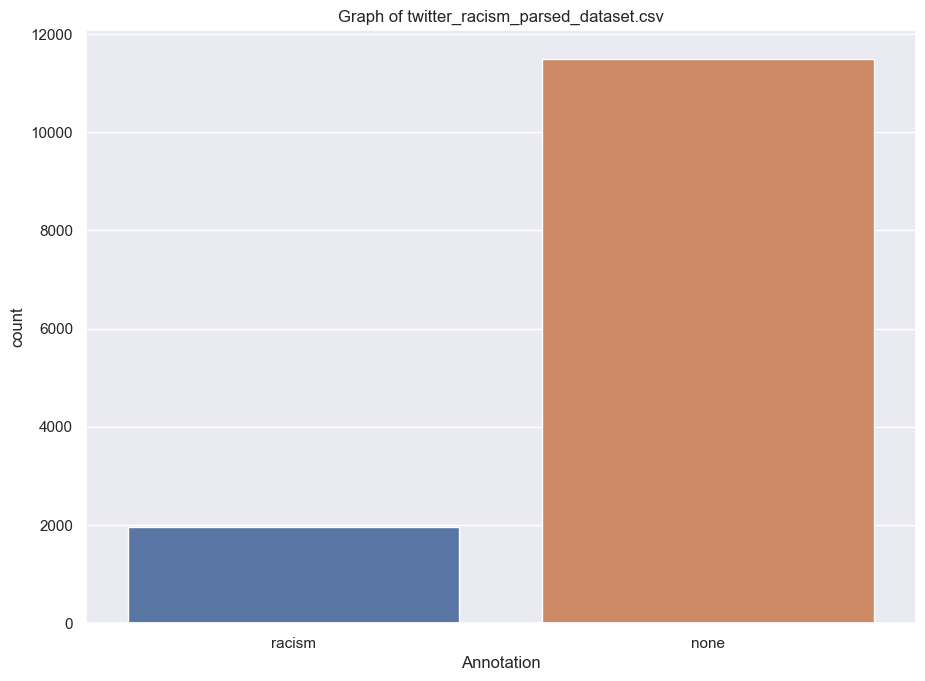

In [17]:
sns.set(rc={'figure.figsize':(10.7,7.7)})
sns.countplot(x='Annotation', data=df_twitter_racism).set(title="Graph of twitter_racism_parsed_dataset.csv")

#### 5.4 twitter_sexism_parsed_dataset.csv

[Text(0.5, 1.0, 'Graph of twitter_sexism_parsed_dataset.csv')]

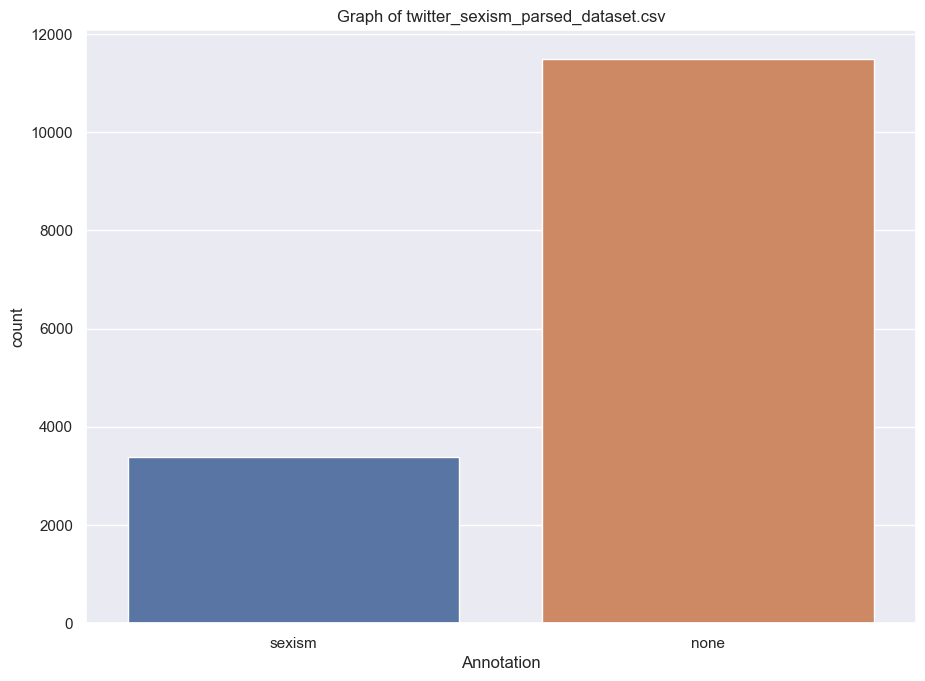

In [18]:
sns.set(rc={'figure.figsize': (10.7, 7.7)})
sns.countplot(x='Annotation', data=df_twitter_sexism).set(title="Graph of twitter_sexism_parsed_dataset.csv")

### 6. Classification for cyberbullying/not cyberbullying & rename columns

#### 6.1 cyberbullying_tweets.csv

In [19]:
df_cyber["cyberbullying_type"] = df_cyber["cyberbullying_type"].replace({"not_cyberbullying": 0})
df_cyber["cyberbullying_type"] = df_cyber["cyberbullying_type"].replace({"ethnicity": 1})
df_cyber["cyberbullying_type"] = df_cyber["cyberbullying_type"].replace({"age": 1})
df_cyber["cyberbullying_type"] = df_cyber["cyberbullying_type"].replace({"gender": 1})
df_cyber["cyberbullying_type"] = df_cyber["cyberbullying_type"].replace({"religion": 1})
df_cyber["cyberbullying_type"] = df_cyber["cyberbullying_type"].replace({"other_cyberbullying": 1})
df_cyber.to_csv('ExportedDatasets/cyberbullying_tweets/cyberbullying_tweets_class.csv', index=False)

In [20]:
df_cyber.head()

,tweet_text,cyberbullying_type
0,"In other words #katandandre, your food was cra...",0
1,Why is #aussietv so white? #MKR #theblock #ImA...,0
2,@XochitlSuckkks a classy whore? Or more red ve...,0
3,"@Jason_Gio meh. :P thanks for the heads up, b...",0
4,@RudhoeEnglish This is an ISIS account pretend...,0


In [21]:
df_cyber.tail()

,tweet_text,cyberbullying_type
47687,"Black ppl aren't expected to do anything, depe...",1
47688,Turner did not withhold his disappointment. Tu...,1
47689,I swear to God. This dumb nigger bitch. I have...,1
47690,Yea fuck you RT @therealexel: IF YOURE A NIGGE...,1
47691,Bro. U gotta chill RT @CHILLShrammy: Dog FUCK ...,1


In [22]:
df_cyber.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47692 entries, 0 to 47691
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_text          47692 non-null  object
 1   cyberbullying_type  47692 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 745.3+ KB


#### 6.2 twitter_parsed_dataset.csv


In [23]:
df_twitter = df_twitter.rename(columns=({'Text':'tweet_text'}))
df_twitter = df_twitter.rename(columns=({'oh_label':'cyberbullying_type'}))
df_twitter = df_twitter.dropna()
df_twitter['cyberbullying_type'] = df_twitter['cyberbullying_type'].astype(int)
df_twitter.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16848 entries, 0 to 16850
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   index               16848 non-null  object
 1   id                  16848 non-null  object
 2   tweet_text          16848 non-null  object
 3   Annotation          16848 non-null  object
 4   cyberbullying_type  16848 non-null  int32 
dtypes: int32(1), object(4)
memory usage: 723.9+ KB


#### 6.3 twitter_racism_parsed_dataset.csv

In [24]:
df_twitter_racism = df_twitter_racism.rename(columns=({'Text':'tweet_text'}))
df_twitter_racism = df_twitter_racism.rename(columns=({'oh_label':'cyberbullying_type'}))
df_twitter_racism = df_twitter_racism.dropna()
df_twitter_racism['cyberbullying_type'] = df_twitter_racism['cyberbullying_type'].astype(int)
df_twitter_racism.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13471 entries, 0 to 13470
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   index               13471 non-null  float64
 1   id                  13471 non-null  float64
 2   tweet_text          13471 non-null  object 
 3   Annotation          13471 non-null  object 
 4   cyberbullying_type  13471 non-null  int32  
dtypes: float64(2), int32(1), object(2)
memory usage: 473.7+ KB


#### 6.4 twitter_sexism_parsed_dataset.csv

In [25]:
df_twitter_sexism = df_twitter_sexism.rename(columns=({'Text':'tweet_text'}))
df_twitter_sexism = df_twitter_sexism.rename(columns=({'oh_label':'cyberbullying_type'}))
df_twitter_sexism = df_twitter_sexism.dropna()
df_twitter_sexism['cyberbullying_type'] = df_twitter_sexism['cyberbullying_type'].astype(int)
df_twitter_sexism.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14878 entries, 0 to 14880
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   index               14878 non-null  object
 1   id                  14878 non-null  object
 2   tweet_text          14878 non-null  object
 3   Annotation          14878 non-null  object
 4   cyberbullying_type  14878 non-null  int32 
dtypes: int32(1), object(4)
memory usage: 639.3+ KB


### 7. Cleaning the tweet text

In [26]:
def clean_tweets(tweet):
    # remove URL
    tweet = re.sub(r'http\S+', '', tweet)
    # Remove usernames
    tweet = re.sub(r'@[^\s]+[\s]?','',tweet)
    # Remove hashtags
    tweet = re.sub(r'#[^\s]+[\s]?','',tweet)
    # remove special characters 
    tweet = re.sub('[^ a-zA-Z0-9]' , '', tweet)
    # remove RT
    tweet = re.sub('RT' , '', tweet)
    # remove Numbers
    tweet = re.sub('[0-9]', '', tweet)
    
    return tweet

#### 7.1 cyberbullying_tweets.csv

In [27]:
df_cyber["tweet_text"] = df_cyber["tweet_text"].apply(clean_tweets)
df_cyber.to_csv('ExportedDatasets/cyberbullying_tweets/cyberbullying_tweets_remove.csv', index=False)
df_cyber.head(30)

,tweet_text,cyberbullying_type
0,In other words your food was crapilicious,0
1,Why is so white,0
2,a classy whore Or more red velvet cupcakes,0
3,meh P thanks for the heads up but not too con...,0
4,This is an ISIS account pretending to be a Kur...,0
5,Yes the test of god is that good or bad or ind...,0
6,Itu sekolah ya bukan tempat bully Ga jauh kaya...,0
7,Karma I hope it bites Kat on the butt She is j...,0
8,everything but mostly my priest,0
9,Rebecca Black Drops Out of School Due to Bullying,0


#### 7.2 twitter_parsed_dataset.csv


In [28]:
df_twitter["tweet_text"] = df_twitter["tweet_text"].apply(clean_tweets)
df_twitter.to_csv('ExportedDatasets/twitter_parsed_dataset/twitter_parsed_dataset_remove.csv', index=False)
df_twitter.head(30)

,index,id,tweet_text,Annotation,cyberbullying_type
0,5.75E+17,5.75E+17,I read them in contextNo change in meaning The...,none,0
1,5.72E+17,5.72E+17,Now you idiots claim that people who tried to ...,none,0
2,3.90E+17,3.90E+17,Call me sexist but when I go to an auto place...,sexism,1
3,5.68E+17,5.68E+17,Wrong ISIS follows the example of Mohammed and...,racism,1
4,5.76E+17,5.76E+17,No No No No No No,none,0
5,5.61E+17,5.61E+17,Saudi preacher who raped and tortured his fi...,none,0
6,4.37E+17,4.37E+17,nooo not sexist but most women are bad drivers,sexism,1
7,5.76E+17,5.76E+17,Going to make some pancakesDont hve any strawb...,none,0
8,5.73E+17,5.73E+17,How dare you have feelings is a fantastic way...,none,0
9,5.00E+17,5.00E+17,Theres something wrong when a girl wins Wayne...,sexism,1


#### 7.3 twitter_racism_parsed_dataset.csv


In [29]:
df_twitter_racism["tweet_text"] = df_twitter_racism["tweet_text"].apply(clean_tweets)
df_twitter_racism.to_csv('ExportedDatasets/twitter_racism_parsed_dataset/twitter_racism_parsed_dataset_remove.csv', index=False)
df_twitter_racism.head(30)

,index,id,tweet_text,Annotation,cyberbullying_type
0,5.767493e+17,5.767493e+17,Muslim mob violence against Hindus in Banglade...,racism,1
1,5.408905e+17,5.408905e+17,,none,0
2,5.678433e+17,5.678433e+17,Islamophobia is like the idea of Naziphobia Is...,racism,1
3,5.766462e+17,5.766462e+17,Finally Im all caught up and that sudden death...,none,0
4,5.713492e+17,5.713492e+17,hugs,none,0
5,5.102409e+17,5.102409e+17,Please PLEASE start using is your discernment ...,none,0
6,5.588514e+17,5.588514e+17,As soon as ISIS chased all the minorities out ...,none,0
7,5.754918e+17,5.754918e+17,Glad you like it,none,0
8,5.646041e+17,5.646041e+17,Islam invaded and conquered of Christiandom b...,racism,1
9,5.633700e+17,5.633700e+17,Do you approve of your pedophile prophet rapin...,racism,1


#### 7.4 twitter_sexism_parsed_dataset.csv


In [30]:
df_twitter_sexism["tweet_text"] = df_twitter_sexism["tweet_text"].apply(clean_tweets)
df_twitter_sexism.to_csv('ExportedDatasets/twitter_sexism_parsed_dataset/twitter_sexism_parsed_dataset_remove.csv', index=False)
df_twitter_sexism.head(30)

,index,id,tweet_text,Annotation,cyberbullying_type
0,5.35198627292254E+017,5.35198627292254E+017,Im not sexist but fuck if youre a woman and y...,sexism,1
1,5.75984924030714E+017,5.75984924030714E+017,Theres some very hate able teams this year,none,0
2,5.7233536016588E+017,5.7233536016588E+017,Everyone underestimated us We still do as wel...,none,0
3,5.72337925708374E+017,5.72337925708374E+017,did or actually check if any of these people ...,none,0
4,4.43033024528011E+017,4.43033024528011E+017,No you dont I thought of a really funny joke a...,sexism,1
5,5.69577286308987E+017,5.69577286308987E+017,You might like this,sexism,1
6,5.75951008863429E+017,5.75951008863429E+017,I bet the campers vote strategicallyat least ...,none,0
7,5.73948678966108E+017,5.73948678966108E+017,it is absurd how much of my amazon wish list c...,none,0
8,5.7233188575119E+017,5.7233188575119E+017,Colin is obviously malnourished from their co...,none,0
9,5.69655750961668E+017,5.69655750961668E+017,Russias army of internet trolls,none,0


### 8. Drop empty tweets & Drop unused columns

#### 8.1 cyberbullying_tweets.csv

In [31]:
df_cyber = df_cyber.astype({'cyberbullying_type': 'int32'})
df_cyber= df_cyber[df_cyber['tweet_text'] != ""]
df_cyber=df_cyber.dropna()
df_cyber.to_csv('ExportedDatasets/cyberbullying_tweets/cyberbullying_tweets_remove_empty.csv', index=False)
df_cyber.head(30)

,tweet_text,cyberbullying_type
0,In other words your food was crapilicious,0
1,Why is so white,0
2,a classy whore Or more red velvet cupcakes,0
3,meh P thanks for the heads up but not too con...,0
4,This is an ISIS account pretending to be a Kur...,0
5,Yes the test of god is that good or bad or ind...,0
6,Itu sekolah ya bukan tempat bully Ga jauh kaya...,0
7,Karma I hope it bites Kat on the butt She is j...,0
8,everything but mostly my priest,0
9,Rebecca Black Drops Out of School Due to Bullying,0


In [32]:
df_cyber.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 47310 entries, 0 to 47691
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_text          47310 non-null  object
 1   cyberbullying_type  47310 non-null  int32 
dtypes: int32(1), object(1)
memory usage: 924.0+ KB


In [33]:
df_cyber['cyberbullying_type'].value_counts()

1    39491
0     7819
Name: cyberbullying_type, dtype: int64

#### 8.2 twitter_parsed_dataset.csv

In [34]:
df_twitter= df_twitter[df_twitter['tweet_text'] != ""]
df_twitter=df_twitter.dropna()
df_twitter = df_twitter.drop(['index','id','Annotation'], axis=1)
df_twitter.to_csv('ExportedDatasets/twitter_parsed_dataset/twitter_parsed_dataset_remove_empty.csv', index=False)
df_twitter.head(30)

,tweet_text,cyberbullying_type
0,I read them in contextNo change in meaning The...,0
1,Now you idiots claim that people who tried to ...,0
2,Call me sexist but when I go to an auto place...,1
3,Wrong ISIS follows the example of Mohammed and...,1
4,No No No No No No,0
5,Saudi preacher who raped and tortured his fi...,0
6,nooo not sexist but most women are bad drivers,1
7,Going to make some pancakesDont hve any strawb...,0
8,How dare you have feelings is a fantastic way...,0
9,Theres something wrong when a girl wins Wayne...,1


In [35]:
df_twitter.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16611 entries, 0 to 16850
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_text          16611 non-null  object
 1   cyberbullying_type  16611 non-null  int32 
dtypes: int32(1), object(1)
memory usage: 324.4+ KB


In [36]:
df_twitter['cyberbullying_type'].value_counts()

0    11268
1     5343
Name: cyberbullying_type, dtype: int64

#### 8.3 twitter_racism_parsed_dataset.csv

In [37]:
df_twitter_racism= df_twitter_racism[df_twitter_racism['tweet_text'] != ""]
df_twitter_racism=df_twitter_racism.dropna()
df_twitter_racism = df_twitter_racism.drop(['index','id','Annotation'], axis=1)
df_twitter_racism.to_csv('ExportedDatasets/twitter_racism_parsed_dataset/twitter_racism_parsed_dataset_remove_empty.csv', index=False)
df_twitter_racism.head(30)

,tweet_text,cyberbullying_type
0,Muslim mob violence against Hindus in Banglade...,1
2,Islamophobia is like the idea of Naziphobia Is...,1
3,Finally Im all caught up and that sudden death...,0
4,hugs,0
5,Please PLEASE start using is your discernment ...,0
6,As soon as ISIS chased all the minorities out ...,0
7,Glad you like it,0
8,Islam invaded and conquered of Christiandom b...,1
9,Do you approve of your pedophile prophet rapin...,1
10,Problem with vile Muslims is that they try to ...,1


In [38]:
df_twitter_racism.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13238 entries, 0 to 13470
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_text          13238 non-null  object
 1   cyberbullying_type  13238 non-null  int32 
dtypes: int32(1), object(1)
memory usage: 258.6+ KB


In [39]:
df_twitter_racism['cyberbullying_type'].value_counts()

0    11268
1     1970
Name: cyberbullying_type, dtype: int64

#### 8.4 twitter_sexism_parsed_dataset.csv

In [40]:
df_twitter_sexism= df_twitter_sexism[df_twitter_sexism['tweet_text'] != ""]
df_twitter_sexism=df_twitter_sexism.dropna()
df_twitter_sexism = df_twitter_sexism.drop(['index','id','Annotation'], axis=1)
df_twitter_sexism.to_csv('ExportedDatasets/twitter_sexism_parsed_dataset/twitter_sexism_parsed_dataset_remove_empty.csv', index=False)
df_twitter_sexism.head(30)

,tweet_text,cyberbullying_type
0,Im not sexist but fuck if youre a woman and y...,1
1,Theres some very hate able teams this year,0
2,Everyone underestimated us We still do as wel...,0
3,did or actually check if any of these people ...,0
4,No you dont I thought of a really funny joke a...,1
5,You might like this,1
6,I bet the campers vote strategicallyat least ...,0
7,it is absurd how much of my amazon wish list c...,0
8,Colin is obviously malnourished from their co...,0
9,Russias army of internet trolls,0


In [41]:
df_twitter_sexism.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14642 entries, 0 to 14880
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_text          14642 non-null  object
 1   cyberbullying_type  14642 non-null  int32 
dtypes: int32(1), object(1)
memory usage: 286.0+ KB


In [42]:
df_twitter_sexism['cyberbullying_type'].value_counts()

0    11268
1     3374
Name: cyberbullying_type, dtype: int64

### 9. Graph of clean Datasets

#### 9.1 cyberbullying_tweets.csv

[Text(0.5, 1.0, 'Graph of clean cyberbullying_tweets.csv')]

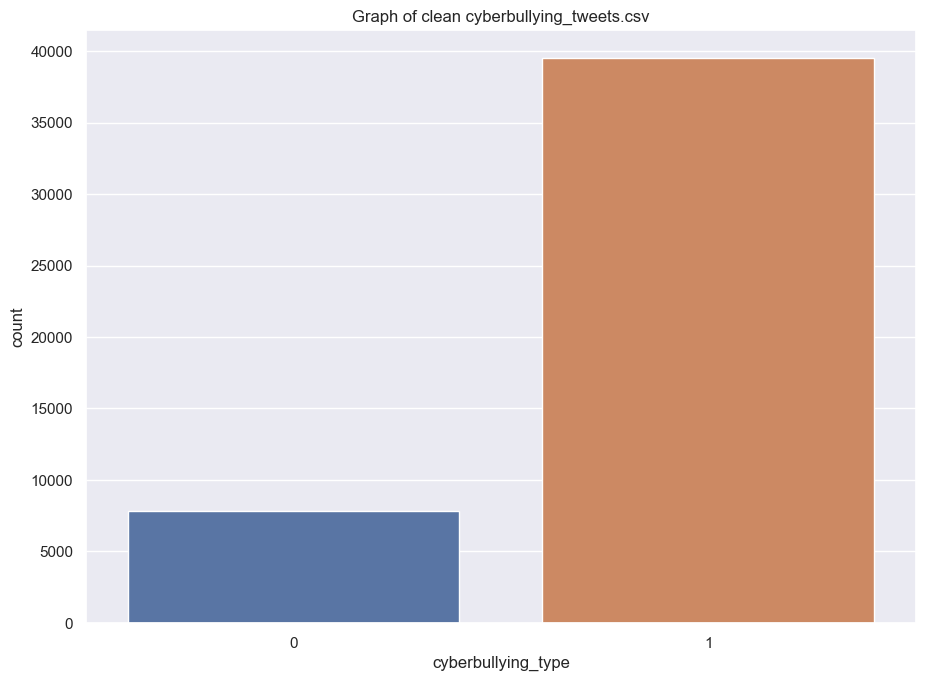

In [43]:
sns.set(rc={'figure.figsize':(10.7,7.7)})
sns.countplot(x='cyberbullying_type', data=df_cyber).set(title="Graph of clean cyberbullying_tweets.csv")

#### 9.2 twitter_parsed_dataset.csv

[Text(0.5, 1.0, 'Graph of clean twitter_parsed_dataset.csv')]

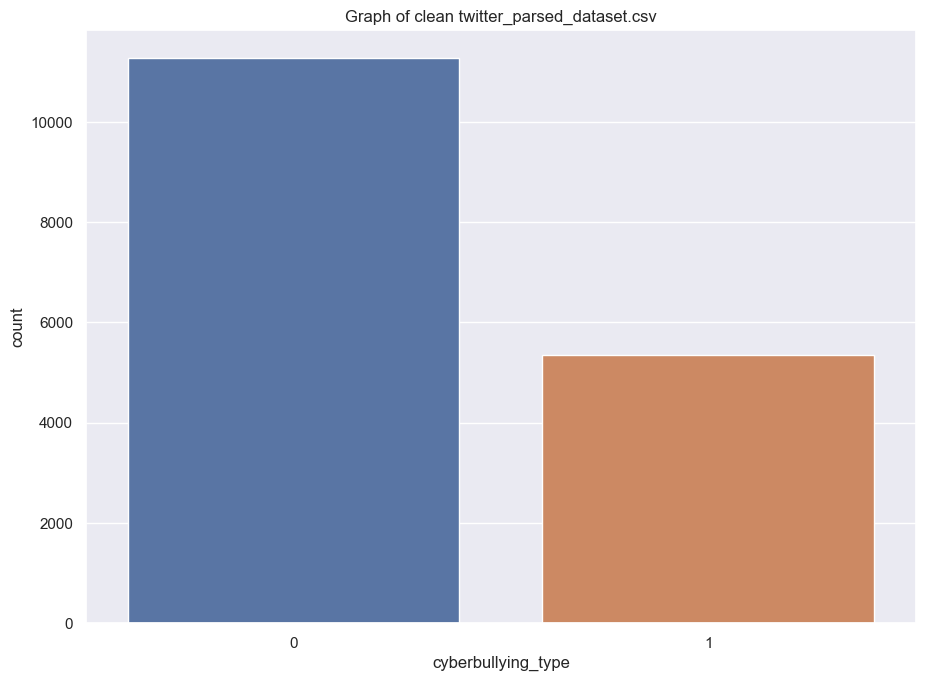

In [44]:
sns.set(rc={'figure.figsize':(10.7,7.7)})
sns.countplot(x='cyberbullying_type', data=df_twitter).set(title="Graph of clean twitter_parsed_dataset.csv")

#### 9.3 twitter_racism_parsed_dataset.csv

[Text(0.5, 1.0, 'Graph of clean twitter_racism_parsed_dataset.csv')]

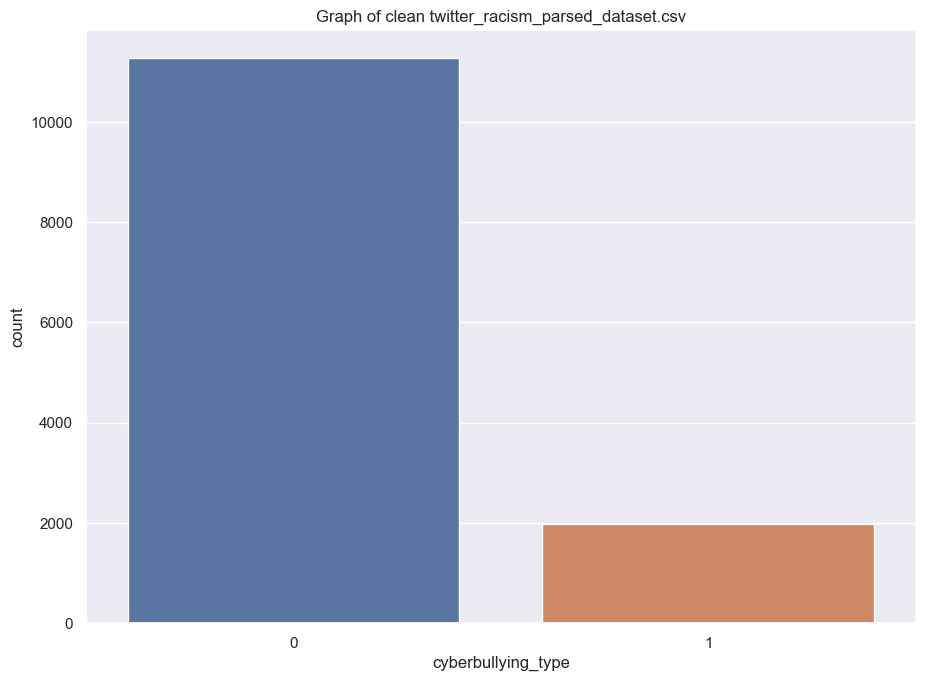

In [45]:
sns.set(rc={'figure.figsize':(10.7,7.7)})
sns.countplot(x='cyberbullying_type', data=df_twitter_racism).set(title="Graph of clean twitter_racism_parsed_dataset.csv")

#### 9.4 twitter_sexism_parsed_dataset.csv

[Text(0.5, 1.0, 'Graph of clean twitter_sexism_parsed_dataset.csv')]

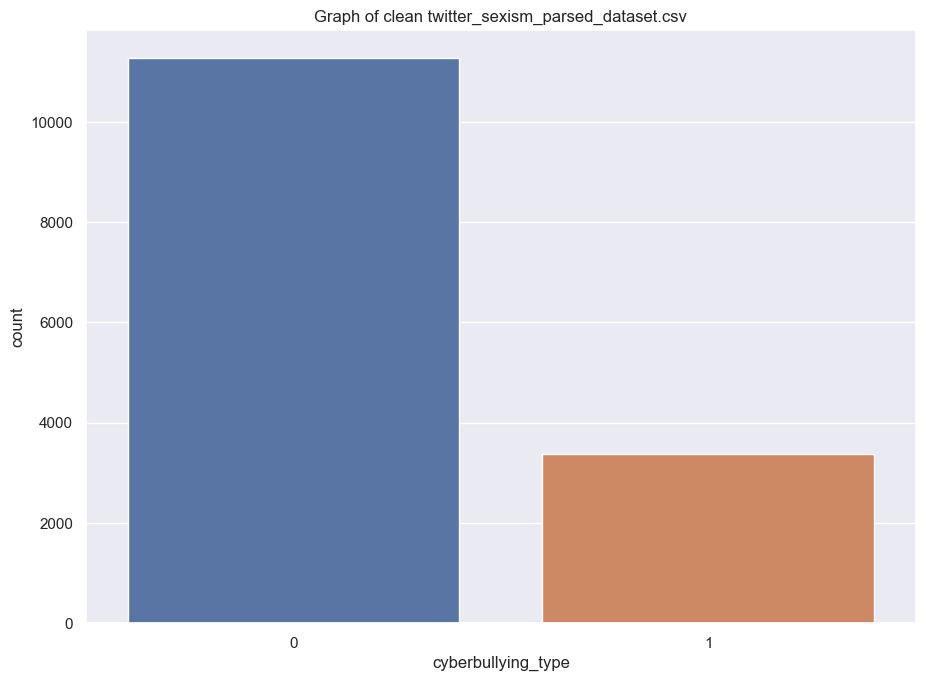

In [46]:
sns.set(rc={'figure.figsize':(10.7,7.7)})
sns.countplot(x='cyberbullying_type', data=df_twitter_sexism).set(title="Graph of clean twitter_sexism_parsed_dataset.csv")

### 10.  WordCloud of clean Dataset

#### 10.1 cyberbullying_tweets.csv

In [47]:
text = ''.join(df_cyber["tweet_text"].tolist())

In [48]:
''.join(df_cyber["tweet_text"].tolist())

'In other words your food was crapilicious Why is so white a classy whore Or more red velvet cupcakesmeh P  thanks for the heads up but not too concerned about another angry dude on twitterThis is an ISIS account pretending to be a Kurdish account  Like Islam it is all liesYes the test of god is that good or bad or indifferent or weird or whatever it all proves gods existenceItu sekolah ya bukan tempat bully Ga jauh kaya nerakaKarma I hope it bites Kat on the butt She is just nasty everything but mostly my priestRebecca Black Drops Out of School Due to BullyingThe Bully flushes on KD Ughhhh  Turkish state has killed  children in last  years    Love that the best response to the hotcakes they managed to film was a noncommittal meh from some adolescent PAREM DE FAZER BULLYING COMIGO  UHAHUAH BANDO DE PRETOtadinhu de mim  sofrendo bulling viu MIMItwitter is basically the angry letters of our generationBest pick up line Hi youre cute  I love how people call James Potter is a bully  mypatro

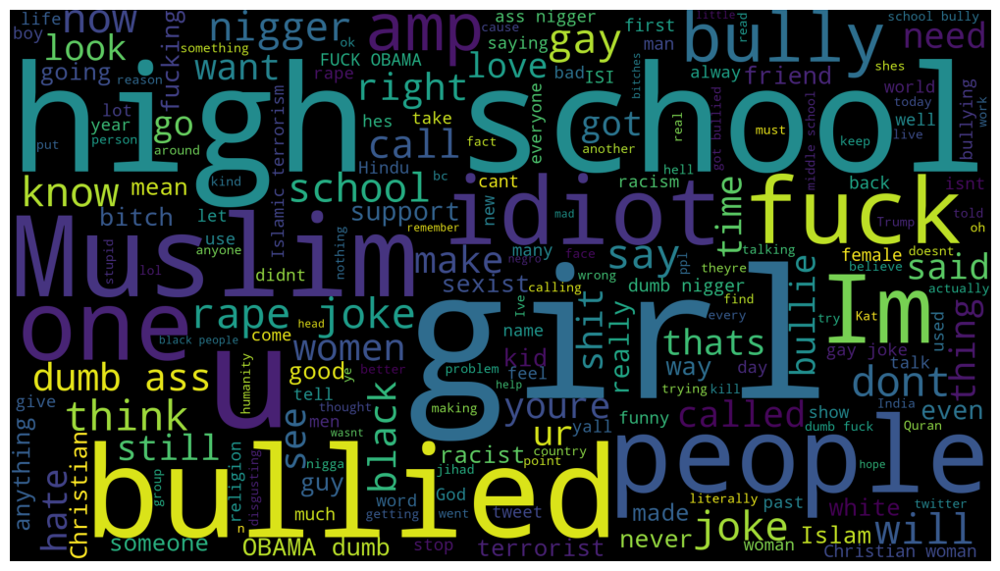

In [49]:
wordcloud = WordCloud(width=1920, height=1080).generate(text)
fig = plt.figure(figsize=(10,10))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

#### 10.2 twitter_parsed_dataset.csv

In [50]:
text = ''.join(df_twitter["tweet_text"].tolist())

In [51]:
''.join(df_twitter["tweet_text"].tolist())

'I read them in contextNo change in meaning The history of Islamic slavery Now you idiots claim that people who tried to stop him from becoming a terrorist made him a terrorist Islamically brain dead Call me sexist but when I go to an auto place Id rather talk to a guyWrong ISIS follows the example of Mohammed and the Quran exactlyNo No No No No No  Saudi preacher who raped and tortured his five yearold daughter to death is released after  nooo not sexist but most women are bad driversGoing to make some pancakesDont hve any strawberries but I hve bananas    How dare you have feelings is a fantastic way to dehumanize someone Theres something wrong when a girl wins Wayne Rooney street striker shes not on the autoblocker and i dont run blockbot blocking manually for now A good Muslim is good despite his bad religion not because of itI help everyone that asks Im not here to pass judgment on anyone that comes looking for helpYeah its called caring about human life idiot  something a genocid

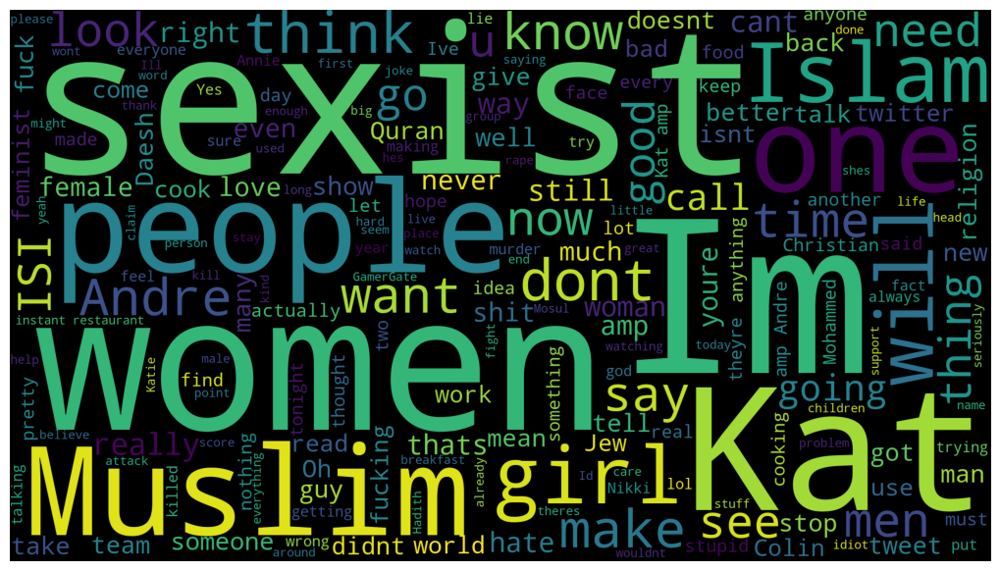

In [52]:
wordcloud = WordCloud(width=1920, height=1080).generate(text)
fig = plt.figure(figsize=(10,10))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

#### 10.3 twitter_racism_parsed_dataset.csv


In [53]:
text = ''.join(df_twitter_racism["tweet_text"].tolist())

In [54]:
''.join(df_twitter_racism["tweet_text"].tolist())

'Muslim mob violence against Hindus in Bangladesh continues in  Islamophobia is like the idea of Naziphobia Islam is a religion of hate and it must be outlawedFinally Im all caught up and that sudden death cook off looks like its gonna be intense hugsPlease PLEASE start using is your discernment blunted by steroids to mean are you on DRUGS from now on DEADAs soon as ISIS chased all the minorities out of Mosul the Sunni Arabs were happy to steal their property  So fuck themGlad you like it Islam invaded and conquered  of Christiandom before any Christian crusades in response The writer is a liarDo you approve of your pedophile prophet raping a  year old girl like it says in  hadithProblem with vile Muslims is that they try to rationalize amp excuse the crimes of Islam rather than get rid of themi dont tend to talk about it much P personal infothats cool next time when a woman talks to him about how his approach is classist he might want to not completely dismiss her Erdogans Egyptian Ni

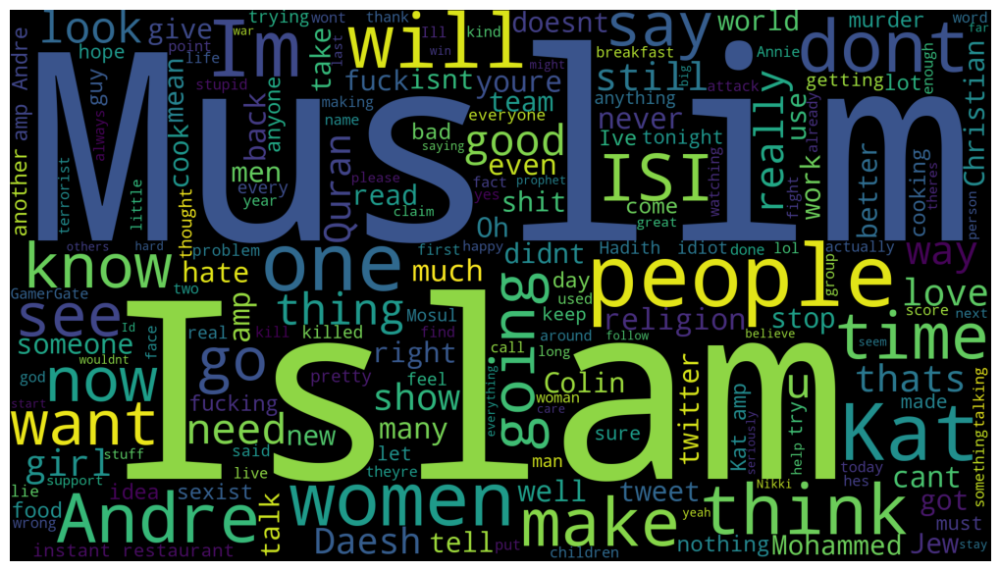

In [55]:
wordcloud = WordCloud(width=1920, height=1080).generate(text)
fig = plt.figure(figsize=(10,10))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

#### 10.4 twitter_sexism_parsed_dataset.csv


In [56]:
text = ''.join(df_twitter_sexism["tweet_text"].tolist())

In [57]:
''.join(df_twitter_sexism["tweet_text"].tolist())

' Im not sexist but fuck if youre a woman and you cant Cook get your shit togetherTheres some very hate able teams this year  Everyone underestimated us We still do as well as underestimating the judging  did or actually check if any of these people could cook No you dont I thought of a really funny joke and I promise Im not sexist but I have to say it You might like this   I bet the campers vote strategicallyat least that is what Kat will say it is absurd how much of my amazon wish list consists of socks Colin is obviously malnourished from their cooking cause he sounds delirious Russias army of internet trolls  But yea apparently women are sock puppetslol Notice we didnt see Kat and Andre in any of those cut aways  Yay is now on twitter If u care abt presumptively innocent D Dudes who go to culinary school If I were blinded by hatred I would feel same about Buddhism Hinduism Tao etc  You are blinded by stupidityEXCUSE ME KOTAKU BUT I AM A DEVOPS NOT JUST AN ACTIVISTits minimum wage T

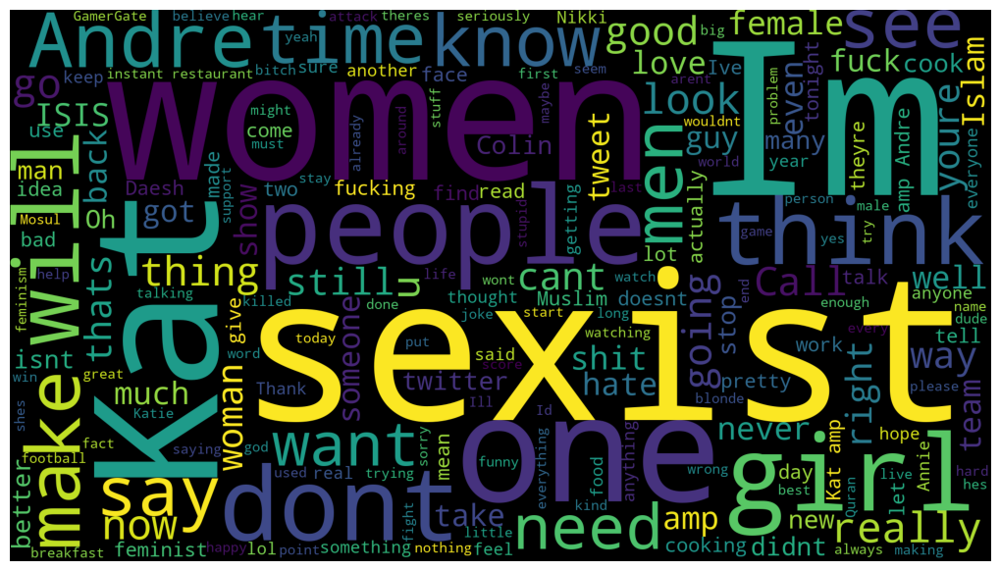

In [58]:
wordcloud = WordCloud(width=1920, height=1080).generate(text)
fig = plt.figure(figsize=(10,10))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

### 11. Addition of Datasets (Final Dataset)

In [59]:
df_cyberbullying_dataset = pd.concat([df_cyber, df_twitter, df_twitter_racism, df_twitter_sexism], axis=0)
df_cyberbullying_dataset.head(10)

,tweet_text,cyberbullying_type
0,In other words your food was crapilicious,0
1,Why is so white,0
2,a classy whore Or more red velvet cupcakes,0
3,meh P thanks for the heads up but not too con...,0
4,This is an ISIS account pretending to be a Kur...,0
5,Yes the test of god is that good or bad or ind...,0
6,Itu sekolah ya bukan tempat bully Ga jauh kaya...,0
7,Karma I hope it bites Kat on the butt She is j...,0
8,everything but mostly my priest,0
9,Rebecca Black Drops Out of School Due to Bullying,0


In [60]:
df_cyberbullying_dataset.dropna(how="any")
df_cyberbullying_dataset= df_cyberbullying_dataset[df_cyberbullying_dataset['tweet_text'] != ""]
df_cyberbullying_dataset.to_csv('ExportedDatasets/cyberbullying_dataset_with_empty.csv', index=True)

In [61]:
df_cyberbullying_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 91801 entries, 0 to 14880
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_text          91801 non-null  object
 1   cyberbullying_type  91801 non-null  int32 
dtypes: int32(1), object(1)
memory usage: 1.8+ MB


In [62]:
df_cyberbullying_dataset.isnull().sum()

tweet_text            0
cyberbullying_type    0
dtype: int64

In [63]:
df_cyberbullying_dataset.dropna(how="any")

,tweet_text,cyberbullying_type
0,In other words your food was crapilicious,0
1,Why is so white,0
2,a classy whore Or more red velvet cupcakes,0
3,meh P thanks for the heads up but not too con...,0
4,This is an ISIS account pretending to be a Kur...,0
...,...,...
14876,WHY DO YOU HATE FREEDOM,0
14877,It is unconscionable that our regulatory bodie...,0
14878,We want ISIS to remain Its the perfect killin...,0
14879,Unbelievable how low Kat amp Andre will go De...,0


In [64]:
df_cyberbullying_dataset.dropna(how="any")

,tweet_text,cyberbullying_type
0,In other words your food was crapilicious,0
1,Why is so white,0
2,a classy whore Or more red velvet cupcakes,0
3,meh P thanks for the heads up but not too con...,0
4,This is an ISIS account pretending to be a Kur...,0
...,...,...
14876,WHY DO YOU HATE FREEDOM,0
14877,It is unconscionable that our regulatory bodie...,0
14878,We want ISIS to remain Its the perfect killin...,0
14879,Unbelievable how low Kat amp Andre will go De...,0


In [65]:
df_cyberbullying_dataset.dropna(axis=0, how='all',inplace=True)
df_cyberbullying_dataset.to_csv('ExportedDatasets/cyberbullying_dataset_with_empty2.csv', index=True)